# Sentinel 2 data extractions for MDBA

Series of extractions run for presentation to MDBA.

By Claire Krause, 19 Feb 2018

In [1]:
% pylab notebook
from datacube import Datacube
from datetime import datetime
from skimage import exposure
s2aws = Datacube(config='/home/156/cek156/.aws_datacube.conf')

Populating the interactive namespace from numpy and matplotlib


In [41]:
def threeBandImage(ds, bands, time = 0, figsize = [10,10], projection = 'projected'):
    '''
    threeBandImage takes three spectral bands and plots them on the RGB bands of an image. 
    
    Inputs: 
    ds -   Dataset containing the bands to be plotted
    bands - list of three bands to be plotted
    
    Optional:
    time - Index value of the time dimension of ds to be plotted
    figsize - dimensions for the output figure
    projection - options are 'projected' or 'geographic'. To determine if the image is in degrees or northings
    '''
    t, y, x = ds[bands[0]].shape
    rawimg = np.zeros((y,x,3), dtype = np.float32)
    for i, colour in enumerate(bands):
        rawimg[:,:,i] = ds[colour][time].values
    rawimg[rawimg == -999] = np.nan
    img_toshow = exposure.equalize_hist(rawimg, mask = np.isfinite(rawimg))
    fig = plt.figure(figsize = figsize)
    imshow(img_toshow)
    ax = plt.gca()
    ax.set_title(str(ds.time[time].values), fontweight = 'bold', fontsize = 16)
    ax.set_xticklabels(ds.x.values)
    ax.set_yticklabels(ds.y.values)
    if projection == 'geographic':
        ax.set_xlabel('Longitude', fontweight = 'bold')
        ax.set_ylabel('Latitude', fontweight = 'bold')
    else:
        ax.set_xlabel('Eastings', fontweight = 'bold')
        ax.set_ylabel('Northings', fontweight = 'bold')


def threeBandImage_subplots(ds, bands, num_cols, figsize = [10,10], projection = 'projected', left  = 0.125, 
                            right = 0.9, bottom = 0.1, top = 0.9, wspace = 0.2, hspace = 0.4):
    '''
    threeBandImage_subplots takes three spectral bands and multiple time steps, and plots them 
    on the RGB bands of an image. 
    
    Inputs: 
    ds -   Dataset containing the bands to be plotted
    bands - list of three bands to be plotted
    num_cols - number of columns for the subplot
    
    Optional:
    figsize - dimensions for the output figure
    projection - options are 'projected' or 'geographic'. To determine if the image is in degrees or northings
    left  = 0.125  # the space on the left side of the subplots of the figure
    right = 0.9    # the space on the right side of the subplots of the figure
    bottom = 0.1   # the space on the bottom of the subplots of the figure
    top = 0.9      # the space on the top of the subplots of the figure
    wspace = 0.2   # the amount of width reserved for blank space between subplots
    hspace = 0.2   # the amount of height reserved for white space between subplots
    '''
    # Find the number of rows/columns we need, based on the number of time steps in ds
    timesteps = ds.time.size
    num_rows = int(ceil(timesteps/num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize = figsize)
    fig.subplots_adjust(left  = left, right = right, bottom = bottom, top = top, wspace = wspace, hspace = hspace)
    numbers = 0
    try:
        for ax in axes.flat:
            t, y, x = ds[bands[0]].shape
            rawimg = np.zeros((y,x,3), dtype = np.float32)
            for i, colour in enumerate(bands):
                rawimg[:,:,i] = ds[colour][numbers].values
            rawimg[rawimg == -999] = np.nan
            img_toshow = exposure.equalize_hist(rawimg, mask = np.isfinite(rawimg))
            ax.imshow(img_toshow)
            ax.set_title(str(ds.time[numbers].values), fontweight = 'bold', fontsize = 12)
            ax.set_xticklabels(ds.x.values, fontsize = 8, rotation = 20)
            ax.set_yticklabels(ds.y.values, fontsize = 8)
            if projection == 'geographic':
                ax.set_xlabel('Longitude', fontweight = 'bold', fontsize = 10)
                ax.set_ylabel('Latitude', fontweight = 'bold', fontsize = 10)
            else:
                ax.set_xlabel('Eastings', fontweight = 'bold', fontsize = 10)
                ax.set_ylabel('Northings', fontweight = 'bold', fontsize = 10)
            numbers = numbers + 1
    except IndexError:
        # This error will pop up if there are not enough scenes to fill the number of rows x columns, so we can 
        # safely ignore it
        fig.delaxes(ax)
        plt.draw()

# Pull in all the available data for the area we are interested in

In [19]:
query = {
        'lat': (-29.97, -30.04),
        'lon': (146.86, 146.93),
        'output_crs': 'EPSG:3577',
        'resolution': (-10, 10),
        }

site_1 = s2aws.load(product='s2a_ard_granule', group_by='solar_day', **query)

In [20]:
site_1

<xarray.Dataset>
Dimensions:        (time: 37, x: 756, y: 858)
Coordinates:
  * time           (time) datetime64[ns] 2015-08-10T00:24:21.457000 ...
  * y              (y) float64 -3.342e+06 -3.342e+06 -3.342e+06 -3.342e+06 ...
  * x              (x) float64 1.414e+06 1.414e+06 1.414e+06 1.414e+06 ...
Data variables:
    pixel_quality  (time, y, x) uint8 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 ...
    contiguity     (time, y, x) uint8 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 ...
    aerosol        (time, y, x) int16 498 513 513 513 513 513 513 562 562 ...
    blue           (time, y, x) int16 652 697 643 545 532 591 605 606 601 ...
    green          (time, y, x) int16 1185 1244 1065 961 977 994 1008 964 ...
    red            (time, y, x) int16 1400 1408 1112 916 923 1011 1121 1168 ...
    rededge1       (time, y, x) int16 2049 1857 1857 1553 1553 1561 1561 ...
    rededge2       (time, y, x) int16 3132 3151 3151 3140 3140 2860 2860 ...
    rededge3       (time, y, x) int16 3280 3309 3309 3

# Plot up all of the available scenes so we can see what their quality is

<IPython.core.display.Javascript object>


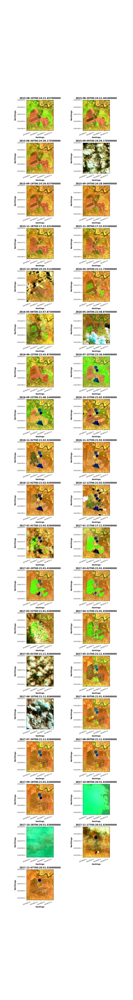

In [50]:
threeBandImage_subplots(site_1, bands = ['swir1','nir','green'], num_cols = 2, figsize = [10, 75])

# Grab single images for the times of interest

<IPython.core.display.Javascript object>


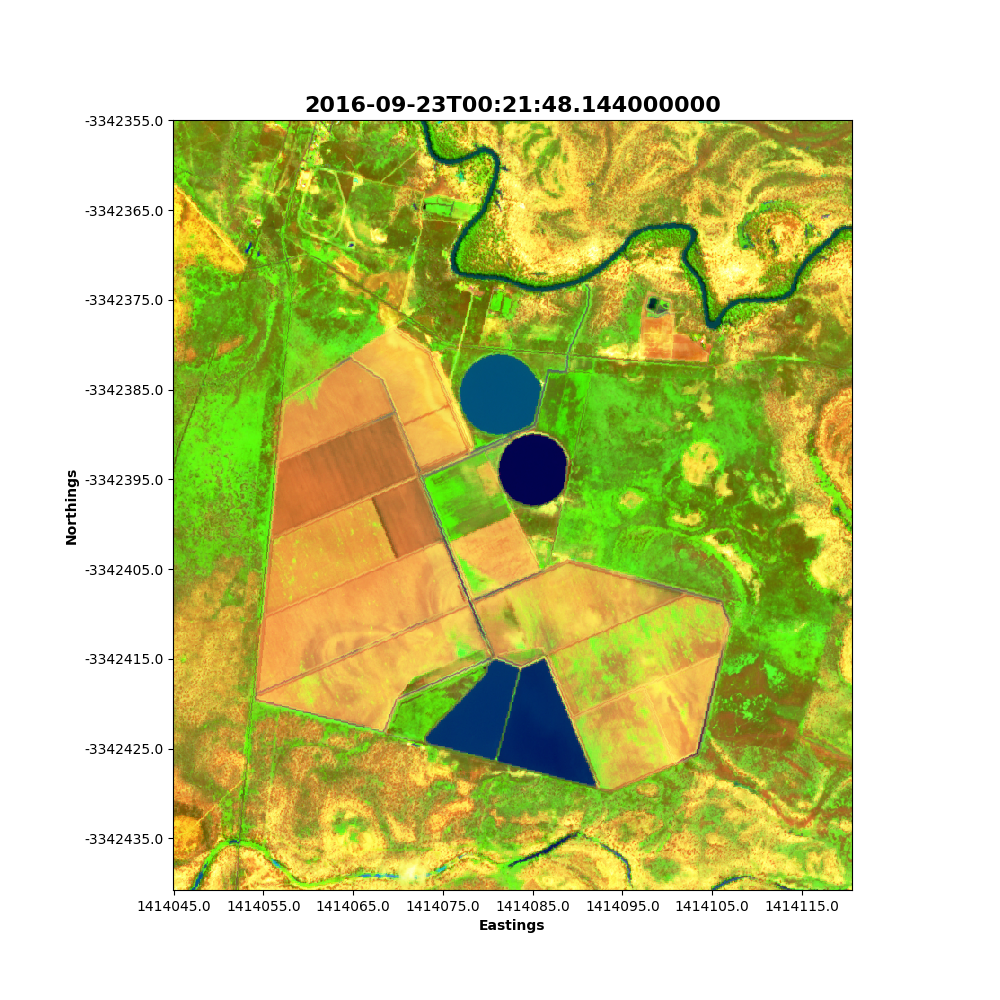

In [51]:
threeBandImage(site_1, bands = ['swir1','nir','green'], time = 14)
savefig('./MDBA_figs/Sentinel2a_23-09-2016.tif')

# Now we want to show off the resolution of Sentinel 2

In [44]:
query = {
        'lat': (-29.98, -30.00),
        'lon': (146.87, 146.91),
        'output_crs': 'EPSG:3577',
        'resolution': (-10, 10),
        'measurements': ('swir1','nir','green'),
        'time':('2016-06-01', '2016-11-30')
        }

site_1_zoom = s2aws.load(product='s2a_ard_granule', group_by='solar_day', **query)

<IPython.core.display.Javascript object>


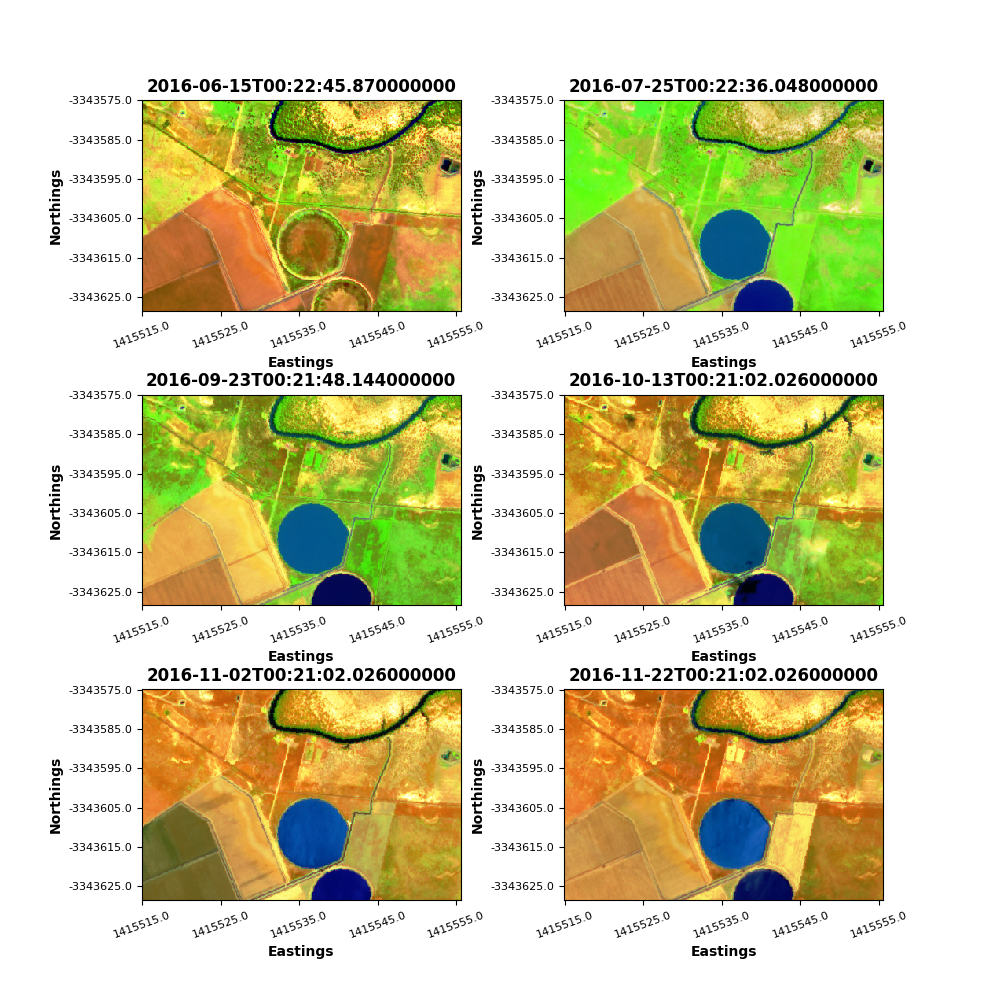

In [46]:
threeBandImage_subplots(site_1_zoom, bands = ['swir1','nir','green'], num_cols = 2, figsize = [10, 10])

<IPython.core.display.Javascript object>


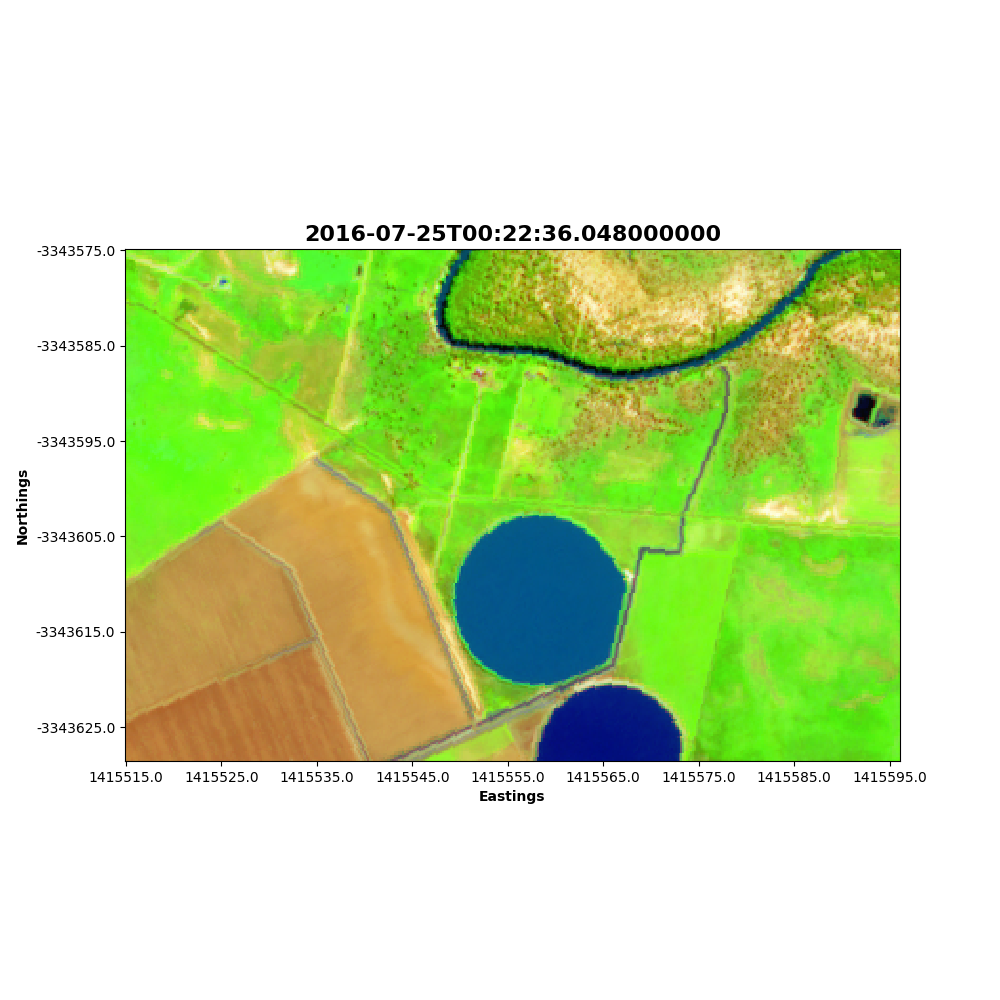

In [49]:
threeBandImage(site_1_zoom, bands = ['swir1','nir','green'], time = 1)
savefig('./MDBA_figs/Sentinel2a_zoom_25-07-2016.jpg')